<img src = 'https://github.com/insaid2018/Term-1/blob/master/Images/INSAID_Full%20Logo.png?raw=true' width="240" height="360">

# Time Series Analysis on Dataset Store_Item_Demand_forecast

## Problem Statement :
 
 - Time series anlaysis and forcast on given dataset.
 - Dataset has 10 stores data with 50 items and datawise sales given from 2013-01-01 to 2017-12-31.
 - We need to apply time series analysis for forecast of in total 500 observations. (i.e. 10 stores * 50 items in each store.)

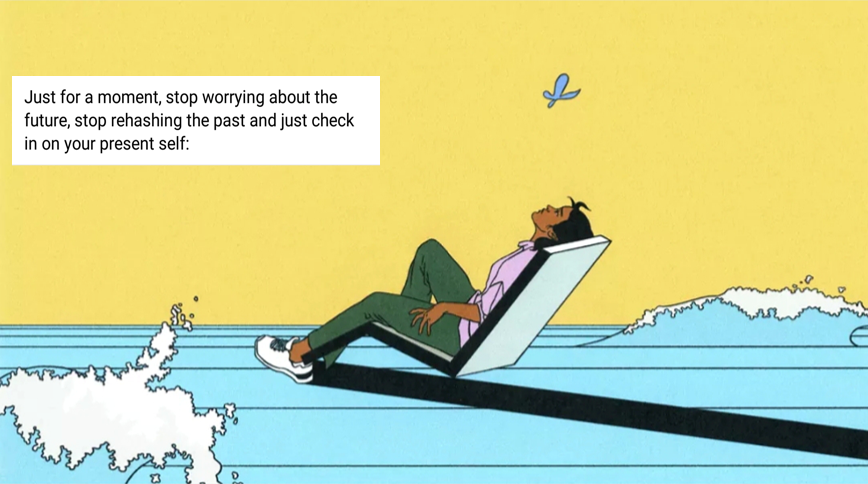

## Load the Dataset

In [1]:
import pandas as pd  
dataset  =  pd.read_csv('https://raw.githubusercontent.com/insaid2018/Term-3/master/Projects/Store_Item_demand_forecast.csv')
dataset.head()

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [2]:
from datetime import datetime

dataset['date']  =  pd.to_datetime(dataset['date'], infer_datetime_format = True)             #convert from string to datetime

StData  =  dataset.set_index(['date'])
StData.head(5)

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10


## Store item demand forecast

The objective of this project is to predict 3 months of item-level sales data at different store locations.

|Data fields|Description|
| :--- | :--- | 
|Date | Date of the sale data. There are no holiday effects or store closures.|
|Store | Store ID |
|Item | Item ID |
|Sales | Number of items sold at a particular store on a particular date. |

In [3]:
StData.shape

(913000, 3)

In [4]:
StData.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 913000 entries, 2013-01-01 to 2017-12-31
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   store   913000 non-null  int64
 1   item    913000 non-null  int64
 2   sales   913000 non-null  int64
dtypes: int64(3)
memory usage: 27.9 MB


## Let's Import Libraries

In [5]:
# data visualization
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

# statistics
from statsmodels.distributions.empirical_distribution import ECDF

# prophet by Facebook
from fbprophet import Prophet

In [6]:
pd.set_option("display.max_rows", 20)
pd.set_option("display.precision", 1)

## ECDF: Empirical Cumulative Distribution Function

In an ECDF, X-axis correspond to the range of values for variables and on the Y-axis proportion of data points that are less than or equal to corresponding X-axis value.

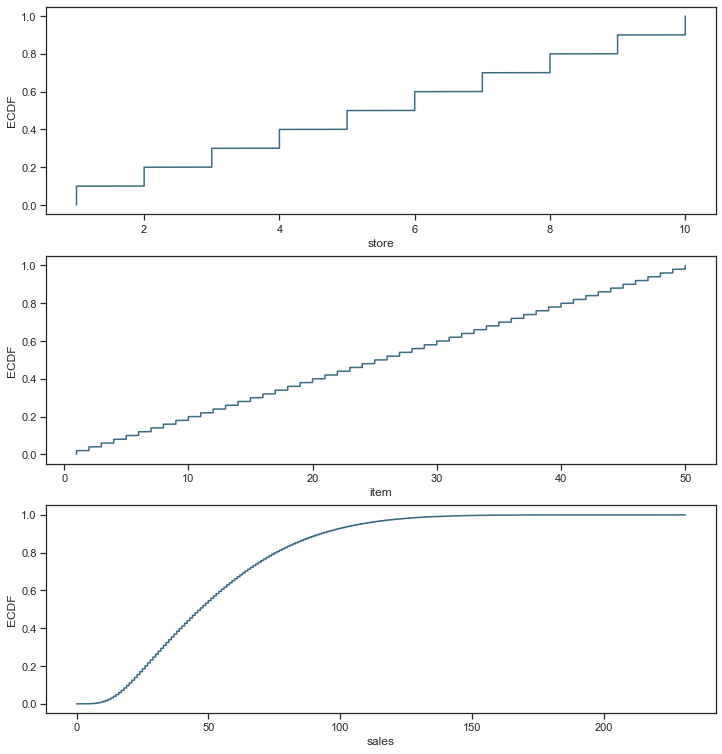

In [7]:
sns.set(style = "ticks")# to format into seaborn 
c = '#386B7F' # basic color for plots
plt.figure(figsize = (12, 13))

plt.subplot(311)
cdf = ECDF(StData['store'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = c);
plt.xlabel('store'); plt.ylabel('ECDF');

plt.subplot(312)
cdf = ECDF(StData['item'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = c);
plt.xlabel('item'); plt.ylabel('ECDF');

plt.subplot(313)
cdf = ECDF(StData['sales'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = c);
plt.xlabel('sales'); plt.ylabel('ECDF');

## Timeseries plot

We can now observe timeseries plot with `def tsplot(tsdf, title)` for all 500 observations of 10 diffrent store at different locations and 50 items. We can compare trend for all observations which are very similar.

In [8]:
# timeseries plot
def tsplot(tsdf, title):
    from scipy import signal
    t = tsdf.index
    y = tsdf['sales']
    yd = signal.detrend(y)
    plt.figure(figsize=(4,3))
    plt.plot(t, y, label="Original Data")
    plt.plot(t, y-yd, "--r", label="Trend")
    plt.axis("tight")
    plt.legend(loc=0)
    plt.title(title)
    plt.show()
    return

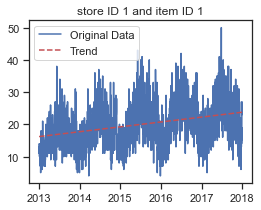

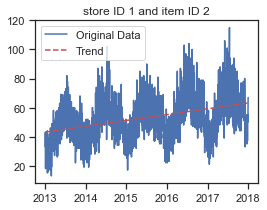

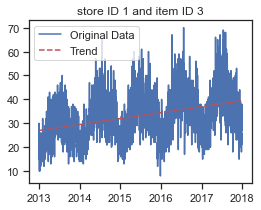

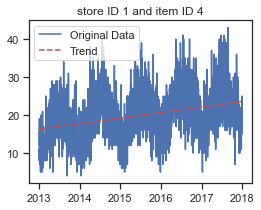

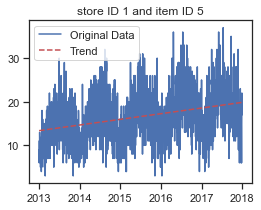

...

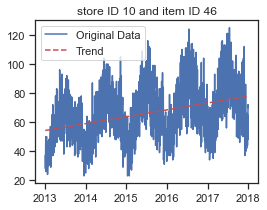

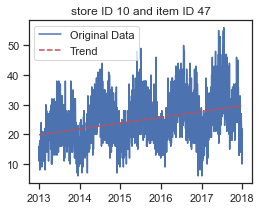

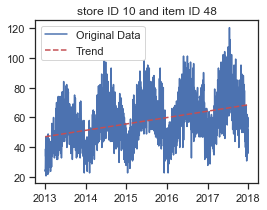

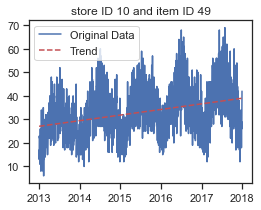

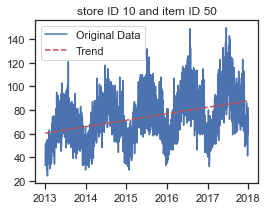

In [9]:
"""
for s in StData['store'].unique():
    tmpdf = StData[StData['store']==s]
    # for i in tmpdf['item'].unique():
    for i in range(1,51):
        tmp2df = tmpdf[tmpdf['item']==i]
        tsplot(tmp2df, "store ID {} and item ID {}".format(s,i))
 """     

## Store wise sales info (Sum, Mean and Count)

In [9]:
Store = StData.groupby(['date','store'])['sales'].agg(['sum','mean','count'])       # Store data groupby info
Store.head()

sum  mean  count
date       store                   
2013-01-01 1      1316  26.3     50
           2      1742  34.8     50
           3      1588  31.8     50
           4      1423  28.5     50
           5      1032  20.6     50

## Item wise sales info (Sum, Mean and Count)

In [10]:
StItems = StData.groupby(['date','item'])['sales'].agg(['sum','mean','count'])        # Item data groupby info
StItems.head()

sum  mean  count
date       item                  
2013-01-01 1     133  13.3     10
           2     327  32.7     10
           3     172  17.2     10
           4     102  10.2     10
           5      83   8.3     10

## Data pivoting for store & item time series

In [11]:
StoreData = pd.pivot_table(StData,values='sales',index='date',columns='store',aggfunc='sum') 
StoreData

store,1,2,3,4,5,6,7,8,9,10
date,,,,,,,,,,
2013-01-01,1316,1742,1588,1423,1032,1099,964,1628,1383,1521
2013-01-02,1264,1808,1538,1432,997,1023,944,1687,1455,1530
2013-01-03,1305,1887,1635,1534,1130,1149,966,1736,1492,1654
2013-01-04,1452,1983,1741,1685,1258,1201,1040,1966,1612,1739
2013-01-05,1499,2087,1887,1649,1154,1286,1131,2005,1698,1841
...,...,...,...,...,...,...,...,...,...,...
2017-12-27,1837,2624,2365,2176,1552,1560,1471,2468,2104,2221
2017-12-28,1951,2839,2479,2306,1696,1707,1509,2660,2309,2429
2017-12-29,2116,3025,2646,2460,1774,1737,1689,2923,2478,2687


In [12]:
ItemsData = pd.pivot_table(StData,values='sales',index='date',columns='item',aggfunc='sum') 
ItemsData

item,1,2,3,4,5,6,7,8,9,10,...,41,42,43,44,45,46,47,48,49,50
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,133,327,172,102,83,288,278,416,245,378,...,103,195,253,154,396,319,116,277,159,330
2013-01-02,99,279,213,110,81,310,291,386,225,397,...,132,215,255,165,393,316,118,281,159,384
2013-01-03,127,304,193,112,96,309,324,398,265,388,...,131,215,306,170,459,325,104,280,187,356
2013-01-04,145,359,218,138,108,343,335,430,313,462,...,122,224,323,189,450,351,128,296,184,394
2013-01-05,149,377,217,144,100,343,377,481,319,449,...,142,243,309,202,533,360,133,344,179,407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-27,154,500,282,172,148,406,457,579,387,546,...,176,264,381,233,681,487,171,374,231,511
2017-12-28,178,495,298,190,157,506,499,644,420,609,...,172,346,415,248,707,473,188,395,276,587
2017-12-29,207,515,332,192,177,530,532,648,494,617,...,185,304,457,277,724,548,213,496,237,596


# Very Important : 

- We are doing time series analysis and forcasting for 500 observations in total and for these we will be observing many information likewise seasonal_decomposition (Trend, Seasonality, Cyclicality, Residual Error), Stationarity checks (rolling means & augmented dickey fuller test), logscale of time series, Exponential Decay weighted average, Timeshifting, predictive model, AR model, ARMA model and ARIMA model.


- So in this book we will use filter of store and item to StData_Nw dataframe and it easy to compute information, time series analysis and forcasting with predictive models.

# Filter store and item here for computing and forecasting. >>>

In [13]:
StData_Nw = StData[(StData['store'] == 1) & (StData['item'] == 1)]
StData_Nw.head()

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-02,1,1,11
2013-01-03,1,1,14
2013-01-04,1,1,13
2013-01-05,1,1,10


In [14]:
StData_Nw.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1826 entries, 2013-01-01 to 2017-12-31
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   store   1826 non-null   int64
 1   item    1826 non-null   int64
 2   sales   1826 non-null   int64
dtypes: int64(3)
memory usage: 57.1 KB


In [15]:
# Resample from daily to monthly
StData_Nw = StData_Nw.resample('MS').sum()

In [16]:
#Missing values
StData_Nw.fillna(method='bfill', inplace=True)
StData_Nw = StData_Nw.drop(columns = ['store','item'], axis=1)
StData_Nw.head()

,sales
date,
2013-01-01,328
2013-02-01,322
2013-03-01,477
2013-04-01,522
2013-05-01,531


In [17]:
StData_Nw.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 60 entries, 2013-01-01 to 2017-12-01
Freq: MS
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   sales   60 non-null     int64
dtypes: int64(1)
memory usage: 960.0 bytes


## Decomposition

We need to observe various components of time series like Trends, Seasonality, Cyclical and Residual Error and so we will work on the `Seasonal_Decomposition` of the time series data.

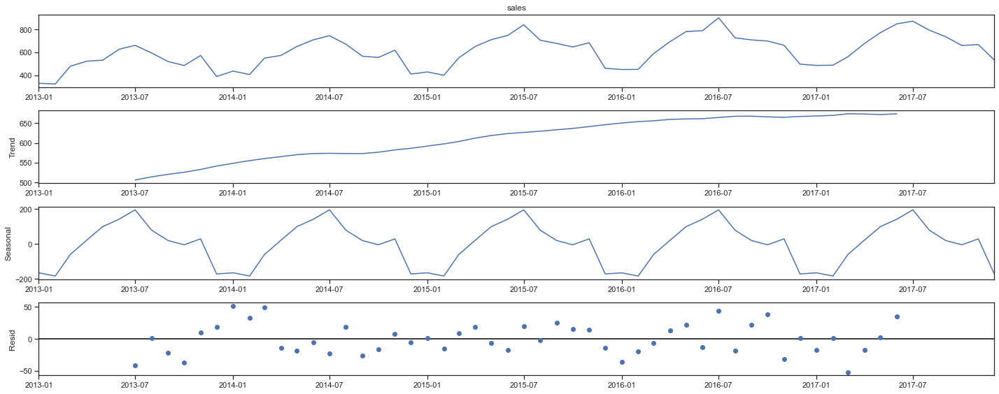

In [18]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize']  =  20, 8

from statsmodels.tsa.seasonal import seasonal_decompose
decomposed_StData_Nw  =  seasonal_decompose(StData_Nw['sales'])         
figure  =  decomposed_StData_Nw.plot()
plt.show()

## Stationarity check

In [19]:
# Determine rolling statistics
def rolling_means(time_series):
    rolmean  =  time_series.rolling(window = 3).mean()    #window size 3 denotes three months, giving rolling mean at quarterly.
    rolstd  =  time_series.rolling(window = 3).std()

    #Plot rolling statistics

    rcParams['figure.figsize']  =  20, 5 

    orig  =  plt.plot(time_series, color = 'blue', label = 'Original')
    mean  =  plt.plot(rolmean, color = 'red', label = 'Rolling Mean')
    std  =  plt.plot(rolstd, color = 'black', label = 'Rolling Std')
    plt.legend(loc = 'best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block = False)

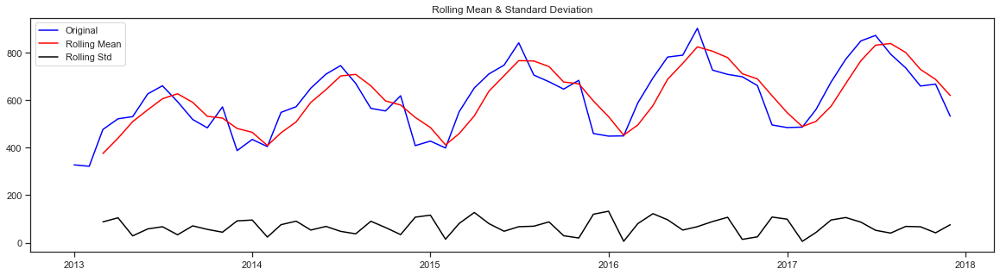

In [20]:
rolling_means(StData_Nw['sales'])

In [21]:
#Perform Augmented Dickey–Fuller test:
def adf_test(time_series):
    from statsmodels.tsa.stattools import adfuller
    dftest  =  adfuller(time_series, autolag = 'AIC')

    dfoutput  =  pd.Series(dftest[0:4], index = ['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key]  =  value
    
    print('Results of Dickey Fuller Test:')    
    print(dfoutput)

In [22]:
adf_test(StData_Nw['sales'])

Results of Dickey Fuller Test:
Test Statistic                -4.1e+00
p-value                        8.0e-04
#Lags Used                     1.1e+01
Number of Observations Used    4.8e+01
Critical Value (1%)           -3.6e+00
Critical Value (5%)           -2.9e+00
Critical Value (10%)          -2.6e+00
dtype: float64


In [23]:
#Perform Kwiatkowski-Phillips-Schmidt-Shin (“KPSS”) test:
from statsmodels.tsa.stattools import kpss
def kpss_test(timeseries):
    print ('Results of KPSS Test:')
    kpsstest = kpss(timeseries, regression='c', nlags="auto")
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    print (kpss_output)

In [24]:
kpss_test(StData_Nw['sales'])

Results of KPSS Test:
Test Statistic           5.1e-01
p-value                  3.8e-02
Lags Used                4.0e+00
Critical Value (10%)     3.5e-01
Critical Value (5%)      4.6e-01
Critical Value (2.5%)    5.7e-01
Critical Value (1%)      7.4e-01
dtype: float64


#### Observations of Rolling mean & SD
- Rolling mean has a __Trend component.__
- Rolling standard deviation has __less fluctuations__ with time series.

For our time series to be stationary, we need to ensure that both the __rolling statistics__ i.e: __mean & stdandard deviation remain time invariant__ or constant with time. Thus the curves for both of them have to be parallel to the x-axis, which in our case is not so. 

#### ADCF test

- p-value found to be 8.0 in this case.
- Test statistics is -4.1 is very much less than Critical Value (1%, 5% 10% confidence intervals). 

#### KPSS test

- p-value found to be 3.8 in this case
- Test Statistics is 5.1 not close to Critical value (1%, 2.5%, 5%, 10% confidence intervals).

It is always better to apply both the tests, so that it can be ensured that the series is truly stationary. Possible outcomes of applying these stationary tests are as follows:

- Case 1: Both tests conclude that the series is not stationary. 
- Case 2: KPSS indicates stationarity and ADF indicates non-stationarity - The series is trend stationary. Trend needs to    be removed to make series strict stationary. The detrended series is checked for stationarity.


## Let's try data transformation to achieve stationarity

### 1. Logscale data transformations

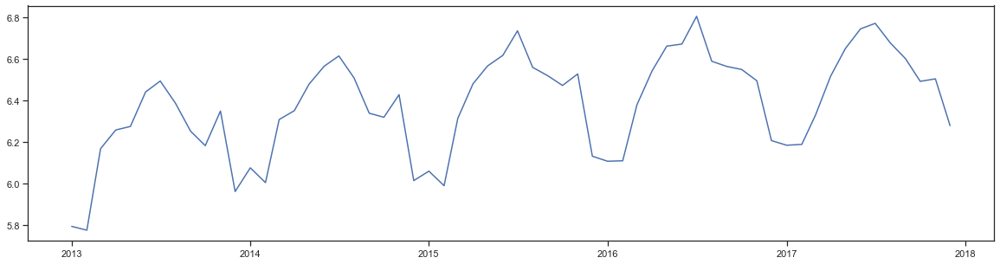

In [25]:
import numpy as np
StData_Nw_logScale  =  np.log(StData_Nw['sales'])
rcParams['figure.figsize']  =  20, 5
plt.plot(StData_Nw_logScale)

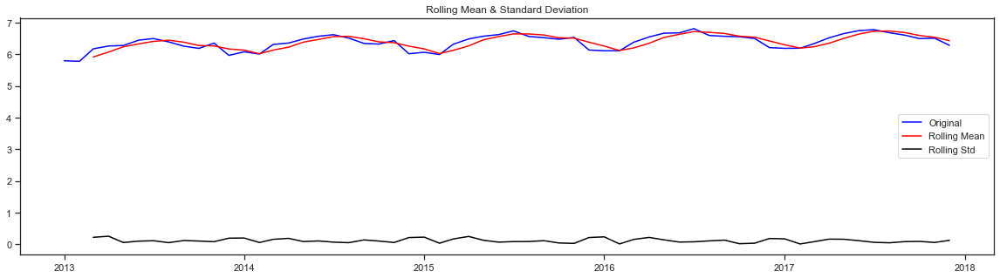

Results of Dickey Fuller Test:
Test Statistic                -4.8e+00
p-value                        5.0e-05
#Lags Used                     1.1e+01
Number of Observations Used    4.8e+01
Critical Value (1%)           -3.6e+00
Critical Value (5%)           -2.9e+00
Critical Value (10%)          -2.6e+00
dtype: float64


In [26]:
rolling_means(StData_Nw_logScale)
adf_test(StData_Nw_logScale)

- Here we can see similar results like our previous ADCF test. We will try moving average of logscale data with rolling window three months and then minus it from logscale data to get our LogScaleMinusMovingAverage time series.

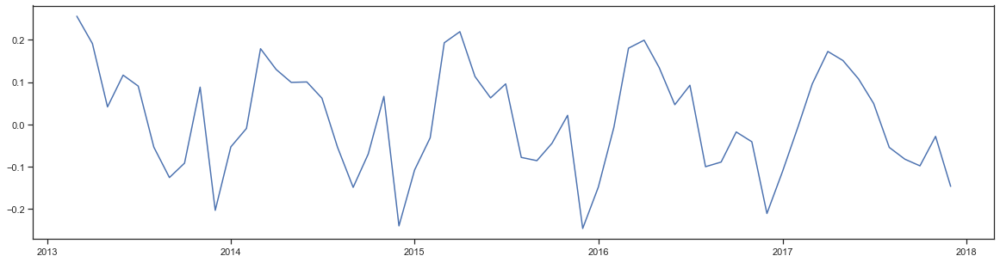

In [27]:
movingAverage  =  StData_Nw_logScale.rolling(window = 3).mean()
datasetLogScaleMinusMovingAverage  =  StData_Nw_logScale - movingAverage
plt.plot(datasetLogScaleMinusMovingAverage)

#Remove NAN values
datasetLogScaleMinusMovingAverage.dropna(inplace = True)

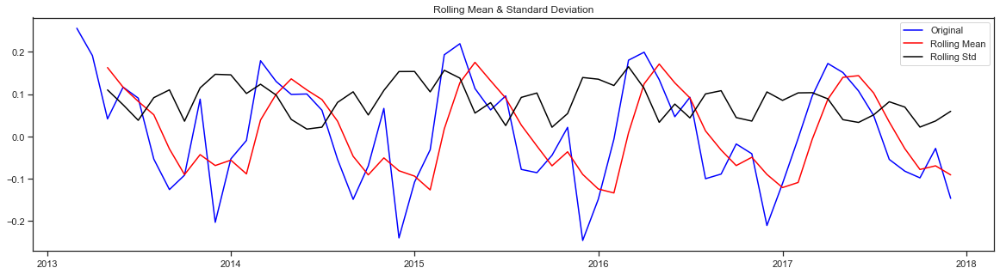

Results of Dickey Fuller Test:
Test Statistic                -2.9e+00
p-value                        4.6e-02
#Lags Used                     1.1e+01
Number of Observations Used    4.6e+01
Critical Value (1%)           -3.6e+00
Critical Value (5%)           -2.9e+00
Critical Value (10%)          -2.6e+00
dtype: float64


In [28]:
#test_stationarity(datasetLogScaleMinusMovingAverage)
rolling_means(datasetLogScaleMinusMovingAverage)
adf_test(datasetLogScaleMinusMovingAverage)

### Observation of logscale transformations:

- p-value is 4.6
- Test statistics is -2.9 is still less than Critical value (1%, 2%, 3% confidence intervals).

## 2. Exponential Decay Weighted Average transformations

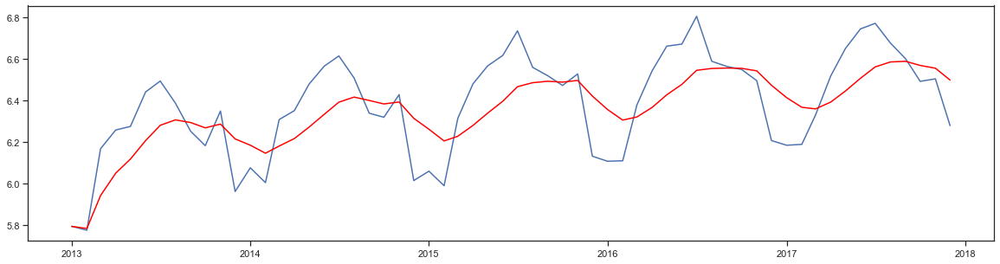

In [29]:
exponentialDecayWeightedAverage  =  StData_Nw_logScale.ewm(halflife = 3, min_periods = 0, adjust = True).mean()
plt.plot(StData_Nw_logScale)
plt.plot(exponentialDecayWeightedAverage, color = 'red')

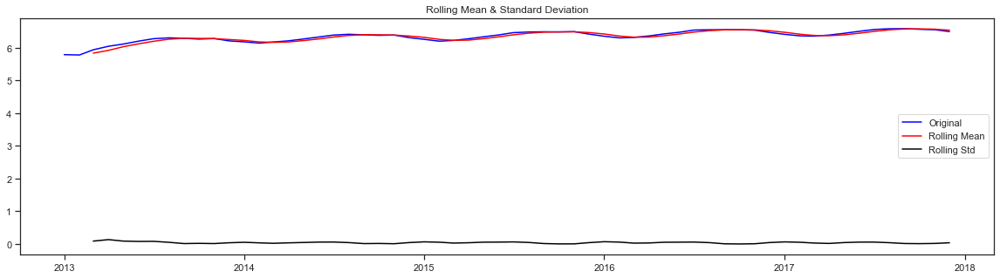

Results of Dickey Fuller Test:
Test Statistic                -3.9e+00
p-value                        1.9e-03
#Lags Used                     9.0e+00
Number of Observations Used    5.0e+01
Critical Value (1%)           -3.6e+00
Critical Value (5%)           -2.9e+00
Critical Value (10%)          -2.6e+00
dtype: float64


In [30]:
#test_stationarity(exponentialDecayWeightedAverage)
rolling_means(exponentialDecayWeightedAverage)
adf_test(exponentialDecayWeightedAverage)

- Here we can see improvements results compared to our previous ADCF test. We will try exponential Decay weighted Average of logscale data with rolling window three months and then minus it from logscale data to get our datasetLogScaleMinusExponentialMovingAverage time series.

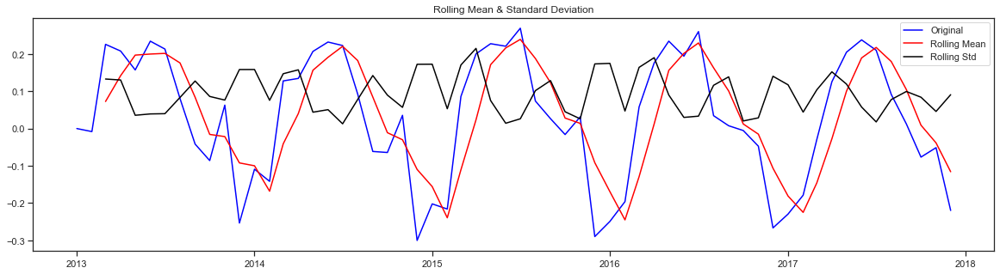

Results of Dickey Fuller Test:
Test Statistic                 -2.3
p-value                         0.2
#Lags Used                     11.0
Number of Observations Used    48.0
Critical Value (1%)            -3.6
Critical Value (5%)            -2.9
Critical Value (10%)           -2.6
dtype: float64


In [31]:
datasetLogScaleMinusExponentialMovingAverage  =  StData_Nw_logScale - exponentialDecayWeightedAverage
#test_stationarity(datasetLogScaleMinusExponentialMovingAverage)
rolling_means(datasetLogScaleMinusExponentialMovingAverage)
adf_test(datasetLogScaleMinusExponentialMovingAverage)

### Observations of Exponential Decay Weighted Average transformations

- p-value is 0.2
- Test statistics is -2.3 which is close to Critical value (1%, 5%, 10% confidence intervals)

## 3. Time Shift transformations

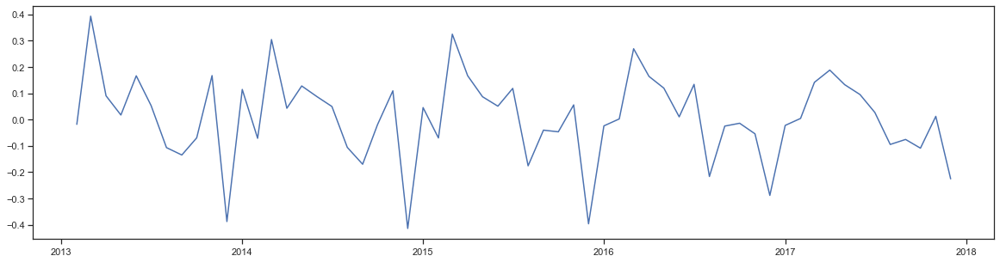

In [32]:
datasetLogDiffShifting  =  StData_Nw_logScale - StData_Nw_logScale.shift()
plt.plot(datasetLogDiffShifting)

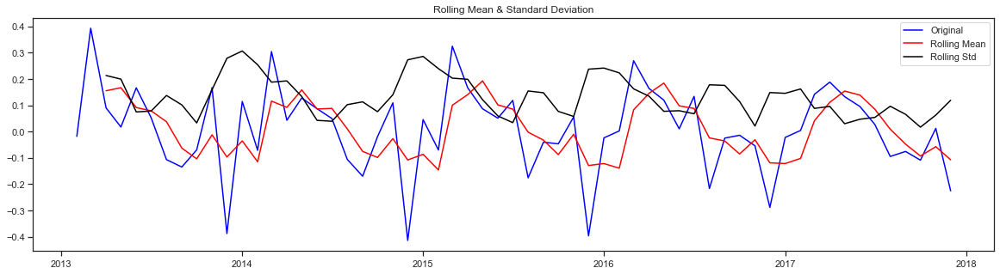

Results of Dickey Fuller Test:
Test Statistic                -4.0e+00
p-value                        1.6e-03
#Lags Used                     1.1e+01
Number of Observations Used    4.7e+01
Critical Value (1%)           -3.6e+00
Critical Value (5%)           -2.9e+00
Critical Value (10%)          -2.6e+00
dtype: float64


In [33]:
datasetLogDiffShifting.dropna(inplace = True)

#test_stationarity(datasetLogDiffShifting)
rolling_means(datasetLogDiffShifting)
adf_test(datasetLogDiffShifting)

### Observations of LogDifferenceShifting transformations:

- p-value is 1.6
- Test Statistics is -4.0 is less than Critical value (1%, 5%, 10% confidence intervals)

## Autocorrelation Function and Partial Autocorrelation Functions and Plot

C:\Users\Nilesh\Software\lib\site-packages\statsmodels\tsa\stattools.py:572: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning


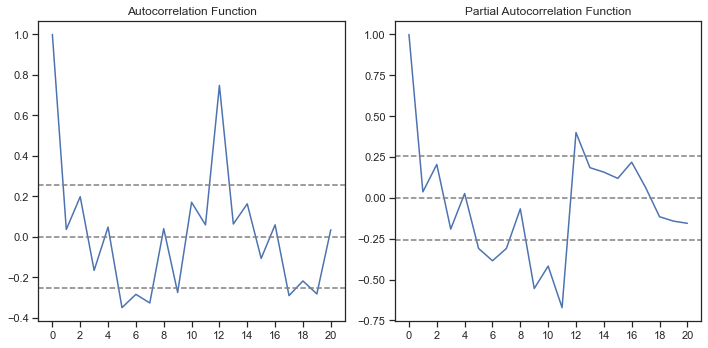

In [34]:
#ACF & PACF plots

from statsmodels.tsa.stattools import acf, pacf

lag_acf  =  acf(datasetLogDiffShifting, nlags = 20)
lag_pacf  = pacf(datasetLogDiffShifting, nlags = 20, method = 'ols')
rcParams['figure.figsize']  =  10, 5
#Plot ACF:
plt.subplot(121)
plt.plot(lag_acf)
plt.axhline(y = 0, linestyle = '--', color = 'gray')
plt.axhline(y = -1.96/np.sqrt(len(datasetLogDiffShifting)), linestyle = '--', color = 'gray')
plt.axhline(y = 1.96/np.sqrt(len(datasetLogDiffShifting)), linestyle = '--', color = 'gray')
plt.xticks(np.arange(0,22,2))
plt.title('Autocorrelation Function')            

#Plot PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y = 0, linestyle = '--', color = 'gray')
plt.axhline(y = -1.96/np.sqrt(len(datasetLogDiffShifting)), linestyle = '--', color = 'gray')
plt.axhline(y = 1.96/np.sqrt(len(datasetLogDiffShifting)), linestyle = '--', color = 'gray')
plt.xticks(np.arange(0,22,2))
plt.title('Partial Autocorrelation Function')
            
plt.tight_layout()   

#### From ACF graph:
- curve touches  y = 0.0 when x = 2 Thus Q = 2

#### From PACF graph:
- curve touches y = 0.0 when x = 2 Thus P = 2

## Let's prepare data for Train and Test with TimeShifting for Predictive model. 


 -  AR Model
 -  ARMA Model
 -  ARIMA model
 

In [35]:
datasetLogDiffShifting.head()

date
2013-02-01   -1.8e-02
2013-03-01    3.9e-01
2013-04-01    9.0e-02
2013-05-01    1.7e-02
2013-06-01    1.7e-01
Freq: MS, Name: sales, dtype: float64

### Let's split data for train and test.

- Forecasting of three months sales of store and item.  
- Dividing testing data for 3 months for performance of time series model evaluation.

In [36]:
# Data Preparation
train, test = datasetLogDiffShifting[1:len(datasetLogDiffShifting)-3], datasetLogDiffShifting[len(datasetLogDiffShifting)-3:]
train.head()

date
2013-03-01    3.9e-01
2013-04-01    9.0e-02
2013-05-01    1.7e-02
2013-06-01    1.7e-01
2013-07-01    5.3e-02
Freq: MS, Name: sales, dtype: float64

### 1. AR Model

In [37]:
from statsmodels.tsa.ar_model import AR           
model = AR(train)                                     
model_fit = model.fit()                          
print('Lag: %s' % model_fit.k_ar)
print('Coefficients: %s' % model_fit.params)

Lag: 10
Coefficients: const        3.4e-02
L1.sales    -4.7e-01
L2.sales    -2.3e-01
L3.sales    -6.1e-01
L4.sales    -3.9e-01
L5.sales    -3.8e-01
L6.sales    -5.4e-01
L7.sales    -5.6e-01
L8.sales    -3.3e-01
L9.sales    -6.0e-01
L10.sales   -4.1e-01
dtype: float64


C:\Users\Nilesh\Software\lib\site-packages\statsmodels\tsa\ar_model.py:691: FutureWarning: 
statsmodels.tsa.AR has been deprecated in favor of statsmodels.tsa.AutoReg and
statsmodels.tsa.SARIMAX.

AutoReg adds the ability to specify exogenous variables, include time trends,
and add seasonal dummies. The AutoReg API differs from AR since the model is
treated as immutable, and so the entire specification including the lag
length must be specified when creating the model. This change is too
substantial to incorporate into the existing AR api. The function
ar_select_order performs lag length selection for AutoReg models.

AutoReg only estimates parameters using conditional MLE (OLS). Use SARIMAX to
estimate ARX and related models using full MLE via the Kalman Filter.

To silence this warning and continue using AR until it is removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.ar_model.AR', FutureWarning)

  warnings.warn(AR_DEPRECATION_WARN, FutureWarning)


### AR model observations:

- we can observe that 10 lags model chosen and trained.
- MSE obtained is 0.013
- It can be seen that AR model is performing quite well for three months forecast.

In [38]:
# make predictions
predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
predictions.head()
for i in range(len(predictions)):
    print('predicted=%f, expected=%f' % (predictions[i], test.iloc[i]))

predicted=-0.060243, expected=-0.108990
predicted=-0.123836, expected=0.012048
predicted=-0.092845, expected=-0.225767


##### Forecasting using the developed model for three months forecast.

Test MSE: 0.013


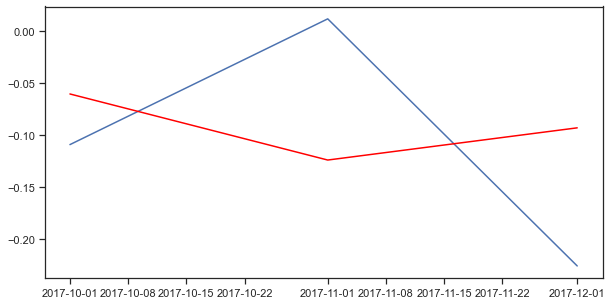

In [39]:
# Model Evaluation  - Test Mean squared error
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
error = mean_squared_error(test, predictions)
print('Test MSE: %.3f' % error)
# plot results

pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

Plotting AR model


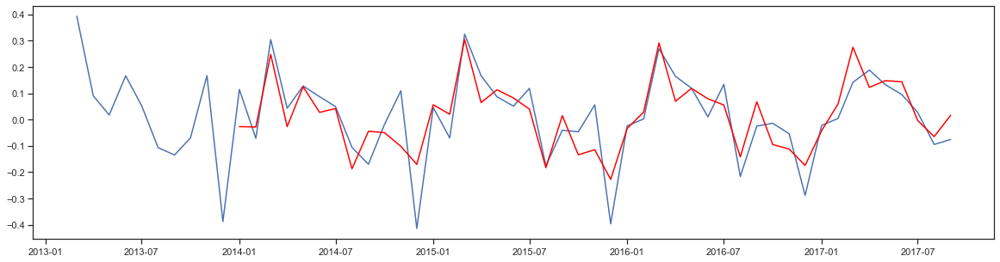

In [40]:
plt.figure(figsize=(20,5))
plt.plot(train)
plt.plot(model_fit.fittedvalues, color = 'red')
print('Plotting AR model')

### 2. ARMA Model

In [42]:
from statsmodels.tsa.arima_model import ARMA
model = ARMA(train,order=(1,1))
model_fit = model.fit()
print('Lag: %s' % model_fit.k_ar)
print('Coefficients: %s' % model_fit.params)

Lag: 1
Coefficients: const          1.6e-02
ar.L1.sales    3.7e-01
ma.L1.sales   -3.0e-01
dtype: float64


### ARMA Model Observations:

- 1 lag observation chosen and trained
- MSE obtained is 0.024 more than AR model - MSE
- Forecasting is not satisfactory as large deviation can be seen in last three months.

In [43]:
# make predictions
predictions = model_fit.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)
for i in range(len(predictions)):
    print('predicted=%f, expected=%f' % (predictions[i], test.iloc[i]))

predicted=0.007142, expected=-0.108990
predicted=0.012476, expected=0.012048
predicted=0.014449, expected=-0.225767


Test MSE: 0.024


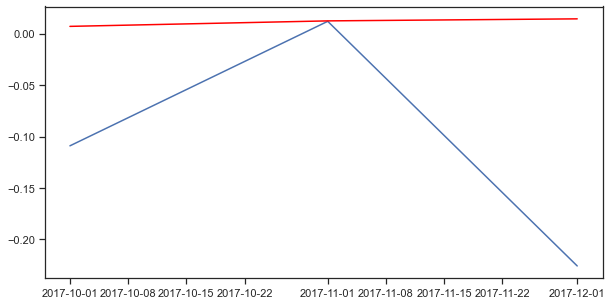

In [44]:
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
error = mean_squared_error(test, predictions)
print('Test MSE: %.3f' % error)
# plot results

pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

Plotting ARMA model


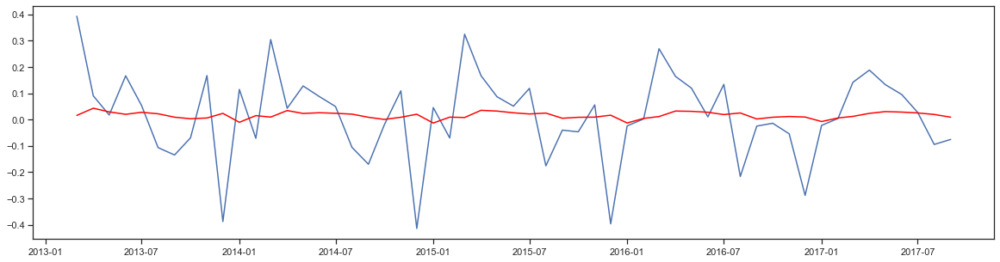

In [45]:
plt.figure(figsize=(20,5))
plt.plot(train)
plt.plot(model_fit.fittedvalues, color = 'red')
print('Plotting ARMA model')

<Figure size 1440x360 with 0 Axes>

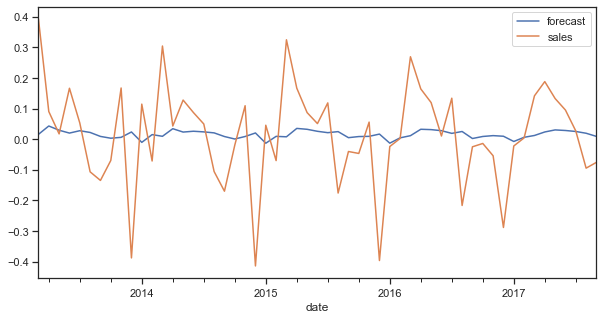

In [46]:
plt.figure(figsize=(20,5))
plot = model_fit.plot_predict()

### 3. ARIMA Model

In [47]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(datasetLogDiffShifting,order=(2,0,2))
print('Lag: %s' % model_fit.k_ar)
print('Coefficients: %s' % model_fit.params)

Lag: 1
Coefficients: const          1.6e-02
ar.L1.sales    3.7e-01
ma.L1.sales   -3.0e-01
dtype: float64


### ARIMA Model Observations:

- p and q value are chosen after consideration of ACF and PACF plots
- 1 lag observations was chosen and trained
- MSE obtained is 0.022 is more than AR model
- Forecasting obtained can fetch the three months future predictions

In [48]:
results_ARIMA = model.fit()

C:\Users\Nilesh\Software\lib\site-packages\statsmodels\tsa\tsatools.py:689: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
C:\Users\Nilesh\Software\lib\site-packages\statsmodels\tsa\tsatools.py:689: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
C:\Users\Nilesh\Software\lib\site-packages\statsmodels\tsa\tsatools.py:690: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
C:\Users\Nilesh\Software\lib\site-packages\statsmodels\tsa\tsatools.py:690: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
C:\Users\Nilesh\Software\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
C:\Users\Nilesh\Software\lib\site-packages\statsmodels\bas

In [49]:
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
error = mean_squared_error(datasetLogDiffShifting, results_ARIMA.fittedvalues)
print('Test MSE: %.3f' % error)

Test MSE: 0.022


In [50]:
results_ARIMA.fittedvalues.head()

date
2013-02-01    7.6e-03
2013-03-01    1.4e-02
2013-04-01   -8.4e-02
2013-05-01   -1.1e-02
2013-06-01   -7.0e-02
Freq: MS, dtype: float64

Plotting ARIMA model


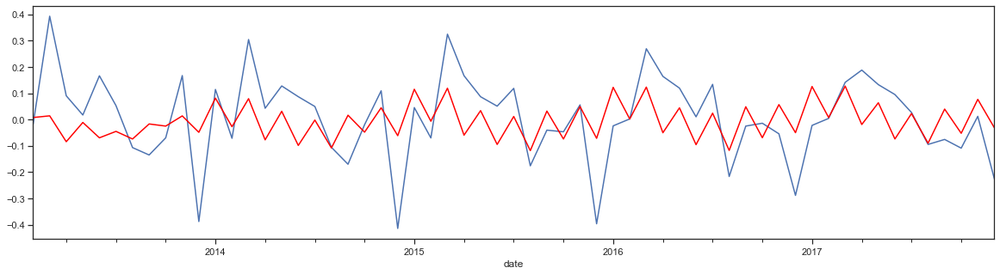

In [51]:
plt.figure(figsize=(20,5))
datasetLogDiffShifting.plot()
results_ARIMA.fittedvalues.plot(color='red')
print('Plotting ARIMA model')

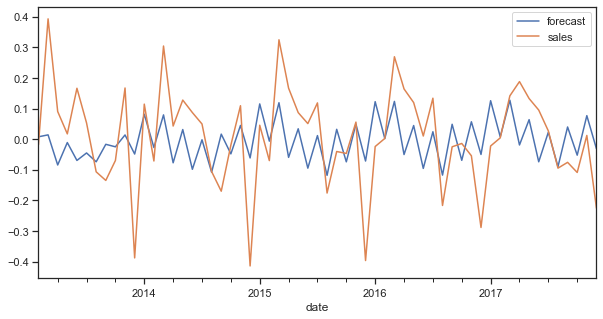

In [52]:
fitted_values = results_ARIMA.plot_predict()

## Prediction and reverse transformations of fittedvalues 

In [53]:
predictions_ARIMA_diff = pd.Series(results_ARIMA.fittedvalues, copy=True)
predictions_ARIMA_diff.head()

date
2013-02-01    7.6e-03
2013-03-01    1.4e-02
2013-04-01   -8.4e-02
2013-05-01   -1.1e-02
2013-06-01   -7.0e-02
Freq: MS, dtype: float64

In [54]:
predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
predictions_ARIMA_diff_cumsum.head()

date
2013-02-01    7.6e-03
2013-03-01    2.1e-02
2013-04-01   -6.3e-02
2013-05-01   -7.4e-02
2013-06-01   -1.4e-01
Freq: MS, dtype: float64

In [55]:
predictions_ARIMA_log = pd.Series(StData_Nw_logScale.iloc[0], index=datasetLogDiffShifting.index)
predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum,fill_value=0)
predictions_ARIMA_log.head()

date
2013-02-01    5.8
2013-03-01    5.8
2013-04-01    5.7
2013-05-01    5.7
2013-06-01    5.6
Freq: MS, dtype: float64

In [56]:
reverted_back_prediction = pd.DataFrame(np.exp(predictions_ARIMA_log))
reverted_back_prediction.head()

,0
date,
2013-02-01,330.5
2013-03-01,335.1
2013-04-01,308.0
2013-05-01,304.5
2013-06-01,284.0


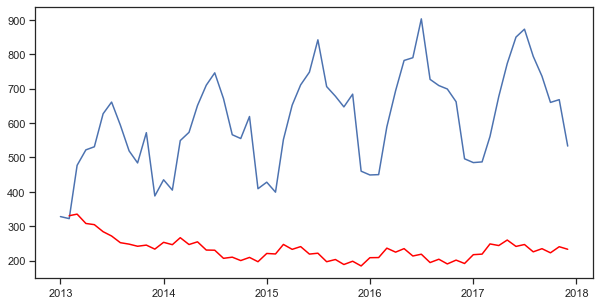

In [57]:
from matplotlib import pyplot
pyplot.plot(StData_Nw)
pyplot.plot(reverted_back_prediction, color='red')
pyplot.show()

In [58]:
StData_Nw_logScale.columns = ['sales in logscale']
reverted_back_prediction.columns = ['ARIMA sales']
datasetLogDiffShifting.columns = ['sales after log diff shifting']

In [59]:
df = pd.concat([StData_Nw, StData_Nw_logScale, datasetLogDiffShifting,reverted_back_prediction], axis=1, sort=False)
df.tail()

,sales,sales,sales,ARIMA sales
date,,,,
2017-08-01,794,6.7,-9.5e-02,225.5
2017-09-01,736,6.6,-7.6e-02,234.6
2017-10-01,660,6.5,-1.1e-01,222.6
2017-11-01,668,6.5,1.2e-02,240.4
2017-12-01,533,6.3,-2.3e-01,232.9


## Forecasting sales of store 1 and Item 1 for next three months

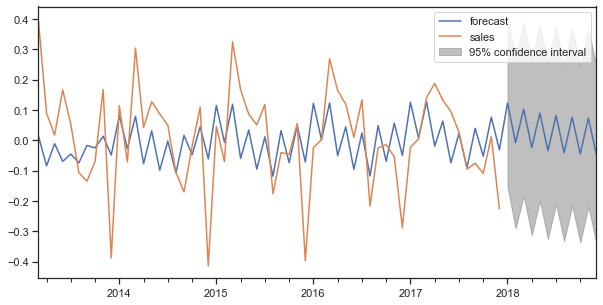

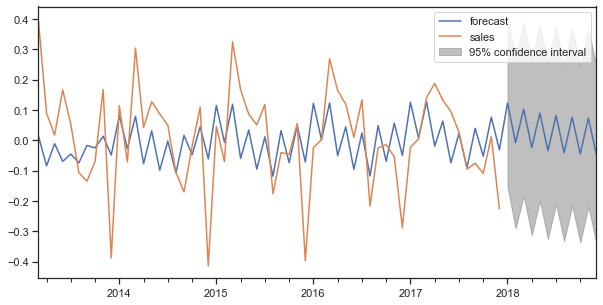

In [60]:
results_ARIMA.plot_predict(1,70) 

## Forecasting of sales of store 1 and item 1 for next three years.

In [61]:
three_yr_forecast = results_ARIMA.predict(start=len(datasetLogDiffShifting),end = len(datasetLogDiffShifting) + 36 )

In [62]:
predictions_ARIMA_diff = pd.Series(three_yr_forecast, copy=True)
predictions_ARIMA_diff.head()

2018-01-01    1.2e-01
2018-02-01   -7.7e-03
2018-03-01    1.0e-01
2018-04-01   -2.4e-02
2018-05-01    9.0e-02
Freq: MS, dtype: float64

In [63]:
predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
predictions_ARIMA_diff_cumsum.head()

2018-01-01    0.1
2018-02-01    0.1
2018-03-01    0.2
2018-04-01    0.2
2018-05-01    0.3
Freq: MS, dtype: float64

In [64]:
predictions_ARIMA_log = pd.Series(StData_Nw_logScale.iloc[-1], index=predictions_ARIMA_diff.index)
predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum,fill_value=0)
predictions_ARIMA_log.head()

2018-01-01    6.4
2018-02-01    6.4
2018-03-01    6.5
2018-04-01    6.5
2018-05-01    6.6
Freq: MS, dtype: float64

In [65]:
reverted_back_prediction = pd.DataFrame(np.exp(predictions_ARIMA_log))
reverted_back_prediction.head()

,0
2018-01-01,602.9
2018-02-01,598.3
2018-03-01,663.1
2018-04-01,647.4
2018-05-01,708.3


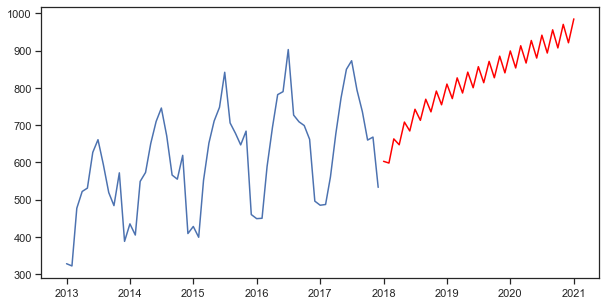

In [66]:
from matplotlib import pyplot
pyplot.plot(StData_Nw)
pyplot.plot(reverted_back_prediction, color='red')
pyplot.show()

## Using ARIMA for making AR and MA models by setting the values of (p,d,q) as (2,1,0) and (0,1,2) respectively.

### AR Model

Plotting AR model


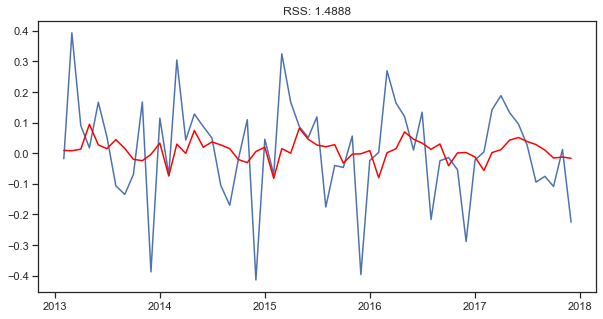

In [67]:
#AR Model
#making order = (2,1,0) gives RSS = 1.4888
 
from statsmodels.tsa.arima_model import ARIMA
model  =  ARIMA(StData_Nw_logScale, order = (2,1,0))
results_AR  =  model.fit()
plt.plot(datasetLogDiffShifting)
plt.plot(results_AR.fittedvalues, color = 'red')
plt.title('RSS: %.4f'%sum((results_AR.fittedvalues - datasetLogDiffShifting)**2))
print('Plotting AR model')

### MA Model

Plotting MA model


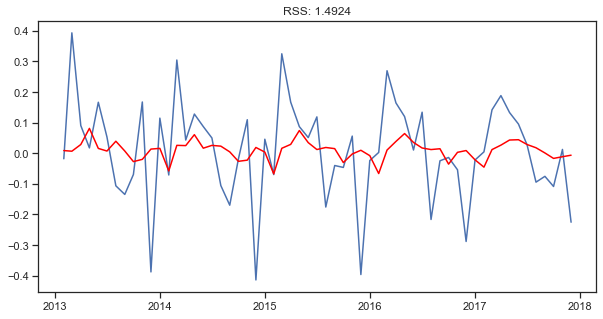

In [68]:
#MA Model
#making order = (2,1,0) gives RSS = 1.4924

model  =  ARIMA(StData_Nw_logScale, order = (0,1,2))
results_MA  =  model.fit()
plt.plot(datasetLogDiffShifting)
plt.plot(results_MA.fittedvalues, color = 'red')
plt.title('RSS: %.4f'%sum((results_MA.fittedvalues - datasetLogDiffShifting)**2))
print('Plotting MA model')

#### Note That:
- Observation of AR Model has RSS 1.488 whereas MA model has 1.4924. 
- Lower RSS value indicates a better model.

# Conclusion:

- We can use the same model with observation of as many classification of stores and items in each store.
- Deploying ARIMA model can give better results for long term as well as short term forecasting of time series.
- For given dataset, Store and item wise sales information and time series components can be assumed to be similar after observation of tsplot for each store and store items.
- We can also run the whole code for datetimeindex and daily sales information.


# THANKS!!!